### Imports

In [226]:
#import required modules
# = used package
import pandas as pd #
import numpy as np #
import pickle #
import matplotlib.pyplot as plt #
import seaborn as sns #
import patsy #
import statsmodels.api as sm #
import statsmodels.formula.api as smf #
import scipy.stats as stats #
from sklearn import model_selection #
from sklearn.linear_model import LinearRegression #
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV # ridge and lasso
from sklearn import preprocessing, linear_model, pipeline #
from sklearn import feature_selection #
from sklearn import metrics #
from sklearn.preprocessing import scale #not necessary?
%matplotlib inline

### Prepare DataFrame

In [227]:
#open pickle file of cleaned and processed data
with open("players_iqr_losses.pkl", 'rb') as picklefile: 
    df = pickle.load(picklefile)

In [228]:
#remove white space from column names for patsy
df.columns = df.columns.str.replace(' ','')
#rename columns with numbers in name for patsy
df = df.rename(columns={'1stServe':'FirstServe','1stServePointsWon':'FirstServePointsWon',
                        '1stServeReturnPointsWon':'FirstServeReturnPointsWon',
                        '2ndServePointsWon':'SecondServePointsWon',
                        '2ndServeReturnPointsWon':'SecondServeReturnPointsWon'})

In [229]:
df

,,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,Ranking,log(Winnings)
Player,Year,,,,,,,,,,,,,,,,,,,,,
Pedro Sousa,2016,0.88,0.50,0.38,0.50,0.39,0,0.14,7,7,0.43,...,0.38,8,0.50,0.43,0.50,1,2,39820,119,10.592125
Roman Safiullin,2017,0.84,0.62,0.26,0.33,0.07,7,0.00,7,0,0.57,...,0.20,9,0.67,0.41,0.57,0,1,17334,381,9.760425
Pedro Sousa,2017,0.83,0.60,0.28,0.53,0.44,2,0.38,10,8,0.40,...,0.34,17,0.65,0.45,0.59,4,1,109827,119,11.606662
Rogerio Dutra Silva,2010,0.83,0.64,0.34,0.59,0.33,2,0.33,5,6,0.40,...,0.34,15,0.80,0.49,0.63,0,0,9761,125,9.186150
Daniel Gimeno-Traver,2017,0.81,0.54,0.00,0.33,0.33,1,0.00,2,0,0.50,...,0.20,2,0.50,0.35,0.50,0,1,32879,272,10.400589
Andres Artunedo Martinavarro,2014,0.77,0.67,0.09,0.55,0.40,3,0.50,6,2,0.50,...,0.26,9,0.67,0.44,0.64,0,1,10434,495,9.252825
Eduardo Struvay,2014,0.76,0.65,0.31,0.36,0.41,1,0.29,6,7,0.33,...,0.35,9,0.56,0.45,0.58,0,1,24218,1107T,10.094851
Riccardo Bellotti,2017,0.76,0.55,0.35,0.39,0.41,0,0.50,9,8,0.33,...,0.37,14,0.57,0.45,0.51,0,1,61154,432,11.021151
Austin Krajicek,2017,0.76,0.78,0.16,0.57,0.49,9,0.25,3,4,0.33,...,0.30,16,0.88,0.50,0.73,0,1,52940,291,10.876914


In [230]:
df.describe()

,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnGamesWon,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,log(Winnings)
count,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,...,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1.893000e+03,1893.000000
mean,0.599847,0.686825,0.265293,0.484849,0.470317,131.630745,0.372805,133.817221,137.267829,0.572974,...,0.180497,0.345895,252.758584,0.727163,0.477702,0.605362,11.344955,10.230322,4.946483e+05,11.913552
std,0.053561,0.070743,0.055997,0.066242,0.067362,185.786928,0.156220,135.577051,164.933960,0.117041,...,0.082179,0.049511,276.873584,0.123888,0.038480,0.059002,15.178775,9.259975,1.222016e+06,1.609532
min,0.360000,0.270000,0.000000,0.060000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.220000,0.250000,0.000000,0.000000,1.080000e+02,4.682131
25%,0.570000,0.650000,0.240000,0.460000,0.440000,8.000000,0.330000,17.000000,11.000000,0.530000,...,0.130000,0.320000,25.000000,0.680000,0.460000,0.580000,1.000000,2.000000,5.552500e+04,10.924589
50%,0.600000,0.700000,0.270000,0.500000,0.480000,45.000000,0.380000,71.000000,56.000000,0.600000,...,0.190000,0.350000,118.000000,0.750000,0.490000,0.610000,4.000000,6.000000,1.537160e+05,11.942862
75%,0.630000,0.730000,0.300000,0.520000,0.510000,186.000000,0.430000,243.000000,233.000000,0.640000,...,0.230000,0.380000,449.000000,0.800000,0.500000,0.640000,18.000000,19.000000,4.639040e+05,13.047433
max,0.880000,0.890000,0.480000,0.920000,0.750000,1447.000000,1.000000,541.000000,825.000000,1.000000,...,0.560000,0.510000,1139.000000,1.000000,0.820000,0.820000,82.000000,36.000000,1.826712e+07,16.720614


(array([702., 301., 123., 135.,  98., 192., 210.,  87.,  42.,   3.]),
 array([ 0. ,  3.6,  7.2, 10.8, 14.4, 18. , 21.6, 25.2, 28.8, 32.4, 36. ]),
 <a list of 10 Patch objects>)

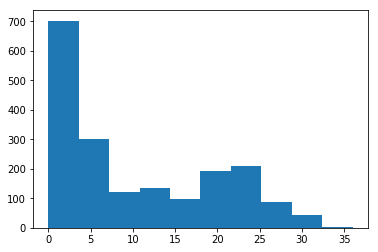

In [231]:
plt.hist(df.Losses)

### Prepare Features and Independent Variables (Outcomes)

In [232]:
## create lists of features and outcomes used in modeling.
features = list(df.columns)[0:18]
outcomes = list(df.columns)[18:21]
outcomes.append(list(df.columns)[22])
wins = outcomes[0]
losses = outcomes[1]
#first looking at winnings for modeling
winnings = outcomes[2]
log_winnings = outcomes[3]

In [233]:
#all features
features

['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesPlayed',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesPlayed',
 'ServiceGamesWon',
 'TotalPointsWon',
 'TotalServicePointsWon']

In [234]:
#all outcomes
outcomes

['Wins', 'Losses', 'Winnings', 'log(Winnings)']

### Correlations

In [235]:
#correlations of all features and outcomes with each other
df.corr()

,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnGamesWon,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,log(Winnings)
FirstServe,1.000000,-0.037610,0.044397,0.129069,0.015073,0.103565,-0.012026,0.093297,0.114248,0.113844,...,0.017789,0.026949,0.122830,0.166012,0.179111,0.209791,0.127021,0.070960,0.120277,0.144996
FirstServePointsWon,-0.037610,1.000000,0.062296,0.366138,0.030834,0.519732,-0.026770,0.358232,0.384552,0.440783,...,0.039492,0.043313,0.445160,0.832150,0.671347,0.871445,0.415174,0.372359,0.260877,0.453193
FirstServeReturnPointsWon,0.044397,0.062296,1.000000,0.118209,0.341991,0.171772,0.334372,0.356485,0.379064,0.079765,...,0.774065,0.845211,0.324796,0.136560,0.529215,0.104170,0.326540,0.270758,0.239939,0.340993
SecondServePointsWon,0.129069,0.366138,0.118209,1.000000,0.141841,0.335783,0.066891,0.326167,0.357624,0.375014,...,0.151254,0.145567,0.377698,0.675248,0.651275,0.732198,0.357380,0.292556,0.262289,0.404765
SecondServeReturnPointsWon,0.015073,0.030834,0.341991,0.141841,1.000000,0.128091,0.277595,0.298705,0.322628,0.099097,...,0.631956,0.744823,0.275033,0.134667,0.444183,0.098392,0.273594,0.214326,0.217982,0.301573
Aces,0.103565,0.519732,0.171772,0.335783,0.128091,1.000000,0.047248,0.718332,0.751074,0.341451,...,0.179882,0.174797,0.853296,0.501343,0.494432,0.547979,0.802944,0.703197,0.492243,0.697038
BreakPointsConverted,-0.012026,-0.026770,0.334372,0.066891,0.277595,0.047248,1.000000,0.121351,0.116201,-0.004946,...,0.556715,0.394760,0.107539,-0.007648,0.263351,0.010650,0.105881,0.075886,0.078280,0.101243
BreakPointsFaced,0.093297,0.358232,0.356485,0.326167,0.298705,0.718332,0.121351,1.000000,0.947051,0.318404,...,0.415882,0.402968,0.957175,0.418055,0.545471,0.424015,0.860347,0.914944,0.491725,0.807704
BreakPointsOpportunities,0.114248,0.384552,0.379064,0.357624,0.322628,0.751074,0.116201,0.947051,1.000000,0.301283,...,0.451456,0.431744,0.972380,0.440377,0.584077,0.460843,0.951722,0.802702,0.679154,0.816674
BreakPointsSaved,0.113844,0.440783,0.079765,0.375014,0.099097,0.341451,-0.004946,0.318404,0.301283,1.000000,...,0.084191,0.088473,0.335639,0.548363,0.494975,0.511262,0.309476,0.284637,0.202863,0.363844


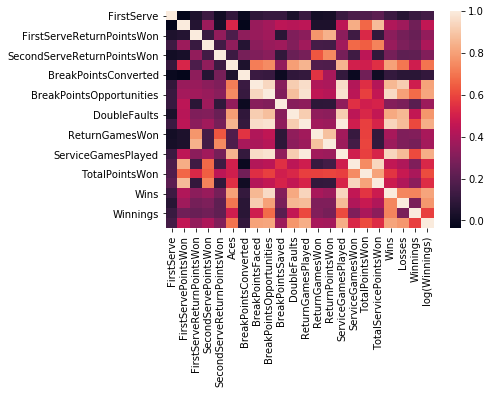

In [236]:
sns.heatmap(df.corr())

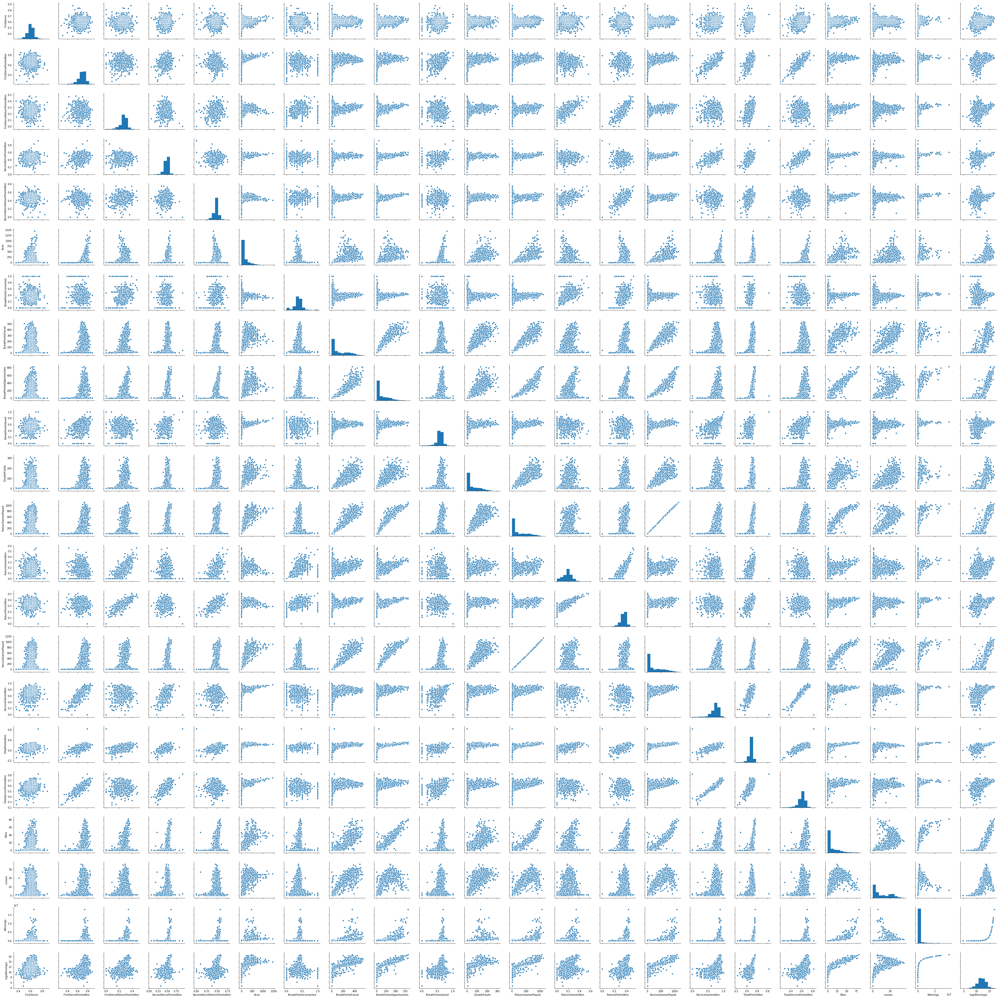

In [237]:
#pair plot to look at distributions of features and outcomes
colors = sns.hls_palette(2)
sns.pairplot(df)

## Modeling

### Model 1 - statsmodels(sm) all features, predicting losses

In [238]:
#convert column names to string for patsy
str = ""
for feat in features:
    str+= feat + " + "
str

'FirstServe + FirstServePointsWon + FirstServeReturnPointsWon + SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced + BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon + ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon + '

In [239]:
#create design matrix with intercept using patsy
y,X = patsy.dmatrices('Losses ~ FirstServe + FirstServePointsWon + FirstServeReturnPointsWon\
+ SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced\
+ BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon\
+ ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon',data=df,return_type='dataframe')

In [240]:
#split the data into training and testing groups
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [241]:
#run first regression model with statsmodels on all data
model_1=sm.OLS(y_train,X_train)
fit_1 = model_1.fit()
fit_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Losses   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.900
Method:                 Least Squares   F-statistic:                     661.8
Date:                Fri, 27 Apr 2018   Prob (F-statistic):               0.00
Time:                        06:08:29   Log-Likelihood:                -3283.6
No. Observations:                1325   AIC:                             6605.
Df Residuals:                    1306   BIC:                             6704.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.0563      2.345      0.024      0.981      -4.544       4.657
FirstServe                    -0.8918      2.824     -0.316      0.752      -6.432       4.648
FirstServePointsWon            7.7068      7.500      1.028      0.304      -7.007      22.420
FirstServeReturnPointsWon     -1.7039      4.629     -0.368      0.713     -10.784       7.377
SecondServePointsWon           0.7063      5.096      0.139      0.890      -9.291      10.703
SecondServeReturnPointsWon    -2.5296      3.106     -0.814      0.416      -8.623       3.564
Aces                          -0.0017      0.002     -1.067      0.286      -0.005       0.001
BreakPointsConverted          -2.4114      0.664     -3.633      0.000      -3.714      -1.109
BreakPointsFaced               0.0719      0.004     19.383      0.000       0.065       0.079
BreakPointsOpportunities      -0.0609      0.003    -19.056      0.000      -0.067      -0.055
BreakPointsSaved              -2.9843      0.886     -3.369      0.001      -4.722      -1.247
DoubleFaults                   0.0034      0.004      0.953      0.341      -0.004       0.011
ReturnGamesPlayed              0.1373      0.018      7.719      0.000       0.102       0.172
ReturnGamesWon                 2.7205      2.711      1.004      0.316      -2.597       8.038
ReturnPointsWon                8.1053      8.339      0.972      0.331      -8.255      24.465
ServiceGamesPlayed            -0.1056      0.018     -6.006      0.000      -0.140      -0.071
ServiceGamesWon               -2.8444      2.200     -1.293      0.196      -7.160       1.471
TotalPointsWon                -7.9365      9.037     -0.878      0.380     -25.665       9.792
TotalServicePointsWon          4.4209     13.594      0.325      0.745     -22.247      31.089
==============================================================================
Omnibus:                      345.645   Durbin-Watson:                   1.912
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12356.580
Skew:                           0.483   Prob(JB):                         0.00
Kurtosis:                      17.929   Cond. No.                     1.26e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.26e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5,1,'Residuals of Train Data')

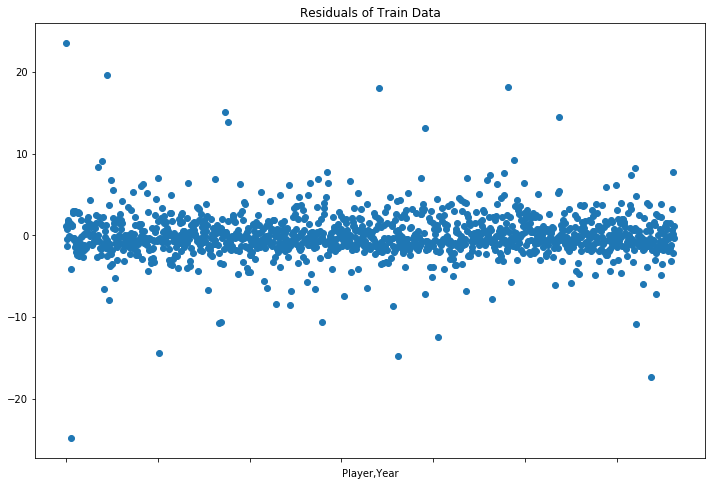

In [242]:
#residual plot on training data
fit_1.resid.plot(style='o',figsize=(12,8))
plt.title('Residuals of Train Data')

In [243]:
#predict of test data
pred_1 = fit_1.predict(X_test)

In [244]:
#find residuals on test data
resid_1 = np.array(y_test['Losses']) - pred_1

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

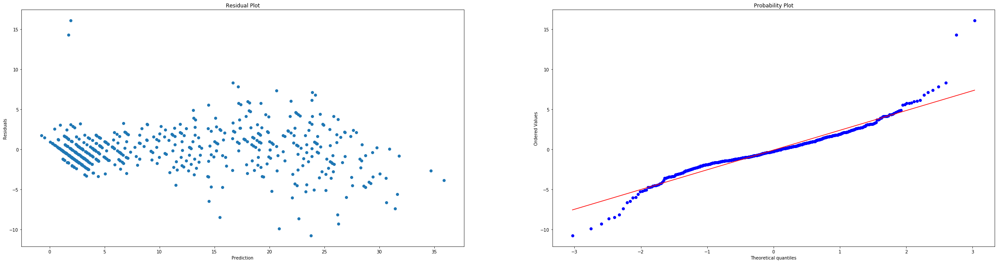

In [245]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(40,10))
plt.xlim(1,22000000)
plt.subplot(1,2,1)
plt.scatter(pred_1,resid_1)
plt.title('Residual Plot')
plt.xlabel('Prediction')
plt.ylabel('Residuals')

plt.subplot(1,2,2)
stats.probplot(resid_1,dist='norm',plot=plt)

### Model 2 - statsmodels (smf) all features, predicting losses

In [246]:
#look at all features and set winning to predicted variable
X = df.loc[:,features]
y = df.loc[:,losses]

In [247]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)
Xy_train = X_train.copy()
Xy_train['Losses'] = y_train

In [248]:
#stats model with no patsy
model_2 = smf.ols('Losses ~ FirstServe + FirstServePointsWon + FirstServeReturnPointsWon\
+ SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced\
+ BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon\
+ ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon',data=Xy_train)
fit_2 = model_2.fit()
fit_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Losses   R-squared:                       0.906
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     695.3
Date:                Fri, 27 Apr 2018   Prob (F-statistic):               0.00
Time:                        06:08:30   Log-Likelihood:                -3263.7
No. Observations:                1325   AIC:                             6565.
Df Residuals:                    1306   BIC:                             6664.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.9364      2.396      0.391      0.696      -3.764       5.637
FirstServe                    -3.9061      2.929     -1.333      0.183      -9.653       1.840
FirstServePointsWon           -3.5884      7.588     -0.473      0.636     -18.474      11.298
FirstServeReturnPointsWon      0.0880      4.729      0.019      0.985      -9.190       9.366
SecondServePointsWon          -3.7047      5.162     -0.718      0.473     -13.831       6.422
SecondServeReturnPointsWon     0.6847      3.126      0.219      0.827      -5.448       6.818
Aces                          -0.0015      0.002     -0.985      0.325      -0.005       0.002
BreakPointsConverted          -2.3315      0.665     -3.507      0.000      -3.636      -1.027
BreakPointsFaced               0.0721      0.004     20.254      0.000       0.065       0.079
BreakPointsOpportunities      -0.0633      0.003    -20.430      0.000      -0.069      -0.057
BreakPointsSaved              -3.5831      0.899     -3.988      0.000      -5.346      -1.820
DoubleFaults                   0.0048      0.003      1.382      0.167      -0.002       0.012
ReturnGamesPlayed              0.1299      0.016      8.051      0.000       0.098       0.162
ReturnGamesWon                 0.1353      2.760      0.049      0.961      -5.279       5.549
ReturnPointsWon                2.3192      8.303      0.279      0.780     -13.969      18.607
ServiceGamesPlayed            -0.0977      0.016     -6.118      0.000      -0.129      -0.066
ServiceGamesWon               -1.0776      2.242     -0.481      0.631      -5.477       3.322
TotalPointsWon                 5.1212      9.310      0.550      0.582     -13.144      23.386
TotalServicePointsWon         11.1895     13.801      0.811      0.418     -15.885      38.263
==============================================================================
Omnibus:                      262.303   Durbin-Watson:                   2.135
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6990.695
Skew:                           0.124   Prob(JB):                         0.00
Kurtosis:                      14.250   Cond. No.                     1.33e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.33e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5,1,'Residuals of Train Data')

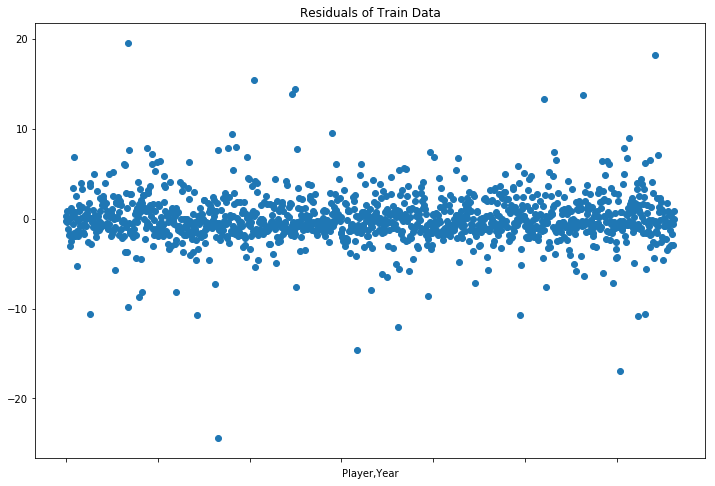

In [249]:
#training residuals
fit_2.resid.plot(style='o',figsize=(12,8))
plt.title('Residuals of Train Data')

In [250]:
#predictions and residuals on test data
pred_2 = fit_2.predict(X_test)
resid_2 = np.array(y_test) - pred_2

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

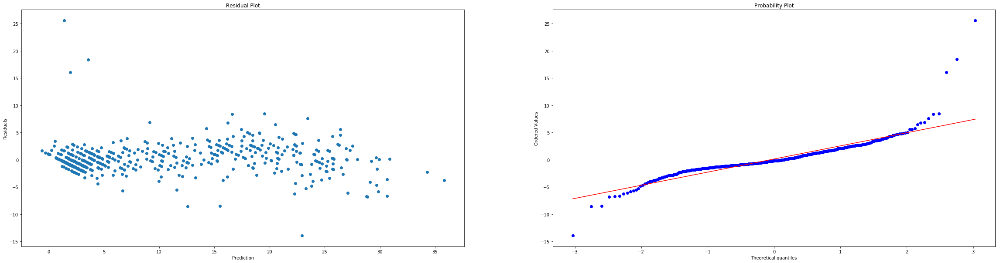

In [251]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(40,10))
plt.xlim(1,22000000)
plt.subplot(1,2,1)
plt.scatter(pred_2,resid_2)
plt.title('Residual Plot')
plt.xlabel('Prediction')
plt.ylabel('Residuals')

plt.subplot(1,2,2)
stats.probplot(resid_2,dist='norm',plot=plt)

### Model 3 - sklearn all features, predicting losses

In [252]:
#done earleir for SMF model
X = df.loc[:,features]
y = df.loc[:,losses]

In [253]:
#done earlier for smf model
#split the data into training and testing groups
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [254]:
lr1 = LinearRegression()
lr1.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [255]:
lr1.score(X_train,y_train)

0.9114406019521897

In [256]:
lr1.score(X_test,y_test)

0.9017362846938303

In [257]:
predict_3 = lr1.predict(X_test)

Text(0,0.5,'Residuals')

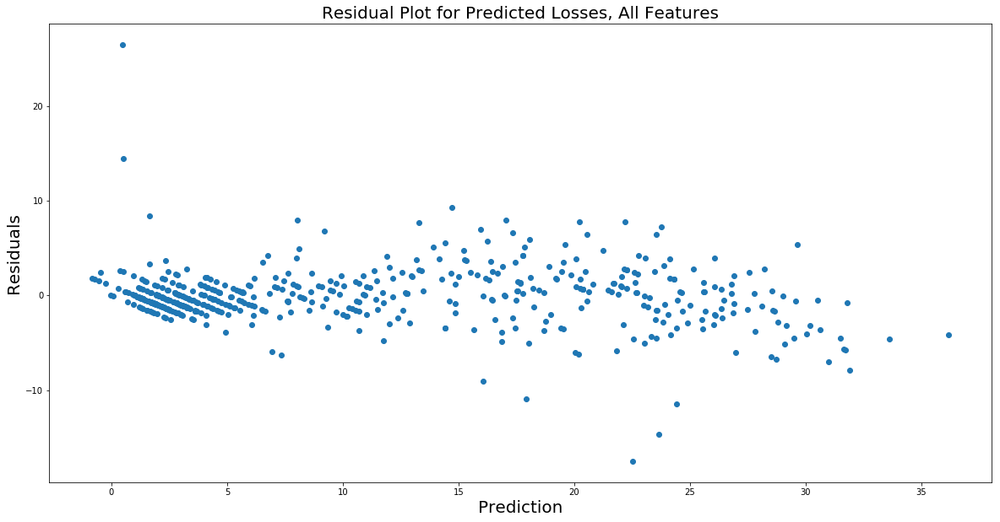

In [258]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
res = y_test - predict_3
plt.scatter(predict_3,res)
plt.title('Residual Plot for Predicted Losses, All Features',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

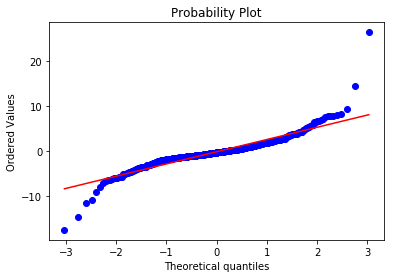

In [259]:
stats.probplot(res,dist='norm',plot=plt)

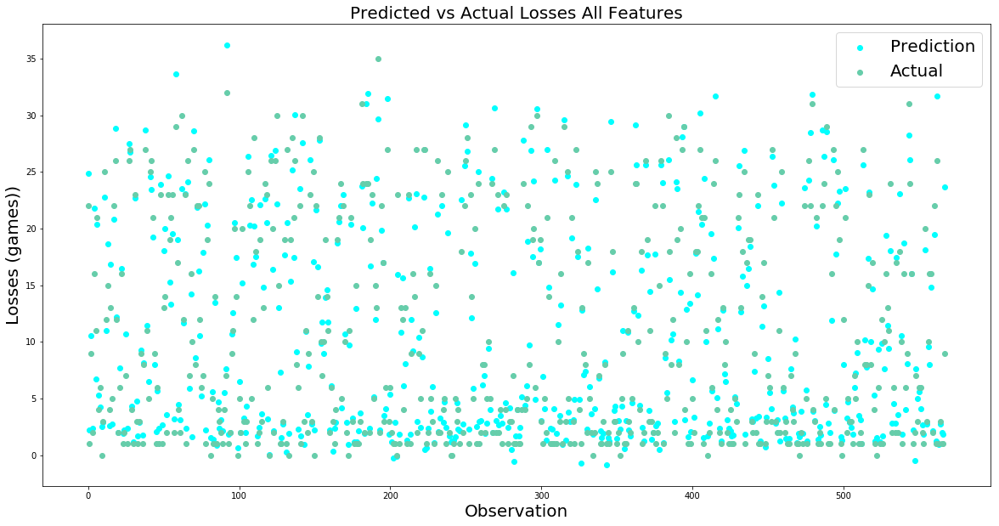

In [260]:
index = [i for i in range(len(predict_3))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_3,label='Prediction',c='#00FFFF')
plt.scatter(index,y_test,label='Actual',c='#66CDAA')
plt.title('Predicted vs Actual Losses All Features',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Losses (games))',fontsize = 20)
plt.legend(fontsize = 20)

In [261]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

### Model 4 - sklearn selected features, predicting losses

In [262]:
selected_features = ['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesWon',
 'TotalServicePointsWon']

In [263]:
X = df.loc[:,selected_features]
y = df.loc[:,losses]

In [264]:
#split into training and testing data
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [265]:
#create model and fit to training data
lr4 = LinearRegression()
lr4.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [266]:
#score on training data
lr4.score(X_train,y_train)

0.8976644515885087

In [267]:
#score on testing data
lr4.score(X_test,y_test)

0.9011417360705936

In [268]:
#predict on train
predict_6_train = lr4.predict(X_train)

In [269]:
#predict on test data
predict_6 = lr4.predict(X_test)

In [270]:
#R^2 train calc by hand -- validating the score
r_2_train = 1-np.sum((predict_6_train-y_train)**2)/np.sum((y_train-np.mean(y_train))**2)
r_2_train

0.8976644515885087

In [271]:
#R^2 test calculated by hand -- validating the score
r_2_test = 1-np.sum((predict_6-y_test)**2)/np.sum((y_test-np.mean(y_test))**2)
r_2_test

0.9011417360705936

Text(0,0.5,'Residuals')

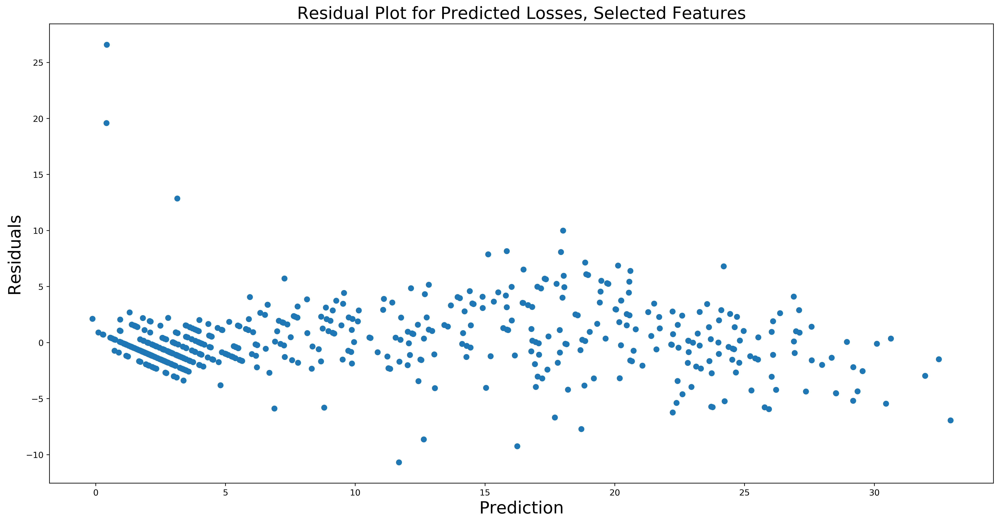

In [272]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
res = y_test - predict_6
plt.scatter(predict_6,res)
plt.title('Residual Plot for Predicted Losses, Selected Features',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

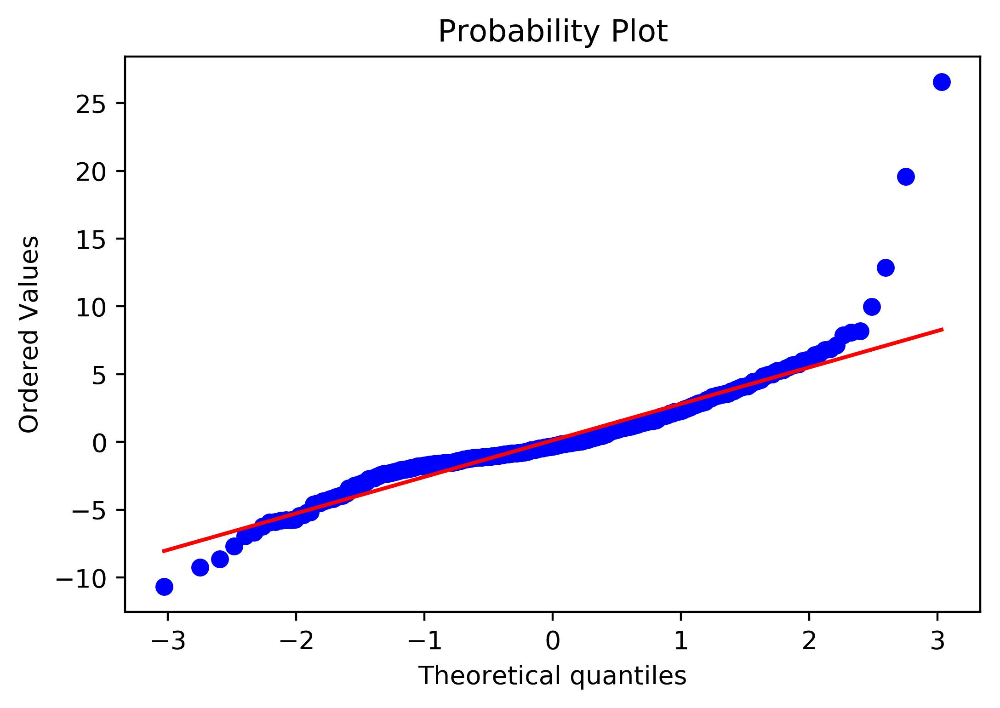

In [273]:
stats.probplot(res,dist='norm',plot=plt)

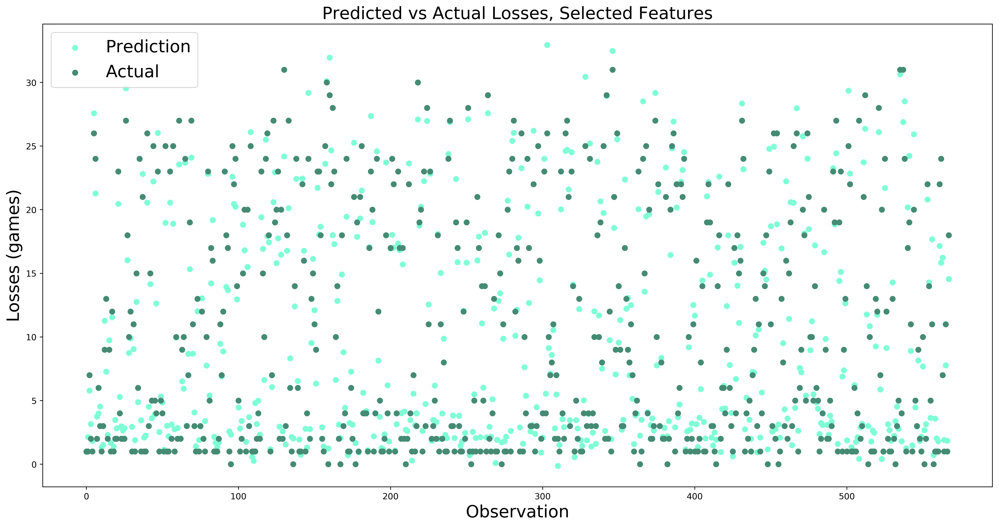

In [274]:
index = [i for i in range(len(predict_6))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_6,label='Prediction',c='#7FFFD4')
plt.scatter(index,y_test,label='Actual',c='#458B74')
plt.title('Predicted vs Actual Losses, Selected Features',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Losses (games)',fontsize = 20)
plt.legend(fontsize = 20)

In [275]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(selected_features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

### Model 5 - sklearn selected features, predicting losses, k=10 folds cross validation

In [311]:
selected_features = ['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesWon',
 'TotalServicePointsWon']

In [312]:
X = df.loc[:,selected_features]
y = df.loc[:,losses]

In [313]:
#set up k folds CV with k=10
k_folds = model_selection.KFold(n_splits=10,shuffle=True)

In [314]:
#10-fold cross validation with scores
lr7 = LinearRegression()
scores = model_selection.cross_val_score(lr7,X,y,cv=k_folds,scoring='r2')
print(scores)

[0.86678655 0.85561741 0.89496373 0.91393232 0.90303419 0.92038996
 0.90443416 0.93999447 0.91019428 0.85744012]


In [315]:
#average score from k=10 folds
np.mean(scores)

0.8966787209906505

In [316]:
#predict on k-folds
predict_7 = model_selection.cross_val_predict(lr7,X,y,cv=k_folds)

In [308]:
resid_7 = predict_7-y

Text(0,0.5,'Residuals')

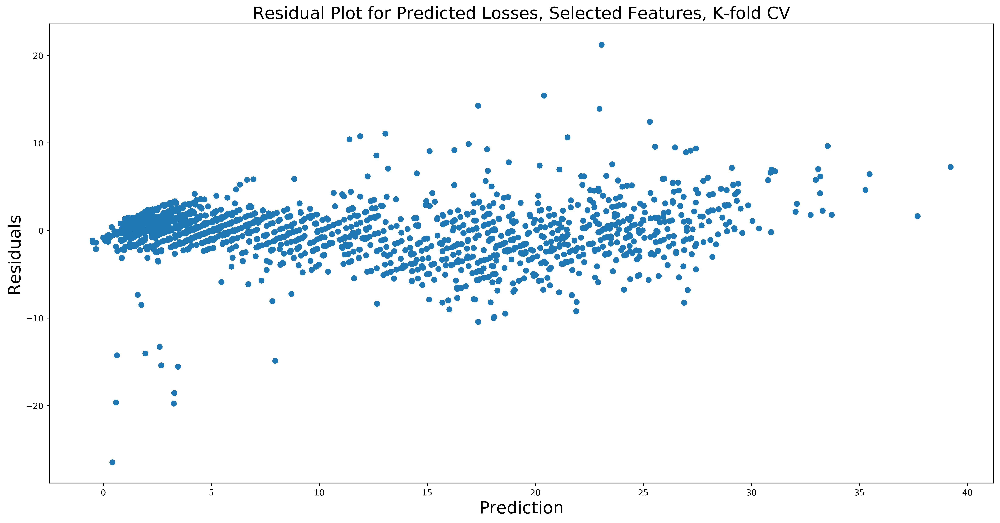

In [317]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
plt.scatter(predict_7,resid_7)
plt.title('Residual Plot for Predicted Losses, Selected Features, K-fold CV',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.37723202, -3.12513099, -2.98523781, ...,  2.98523781,
          3.12513099,  3.37723202]),
  array([-26.46222368, -19.7549995 , -19.62112704, ...,  14.24955343,
          15.41469969,  21.21642587])),
 (2.779401210457773, 0.0004584795315724192, 0.9360402680436589))

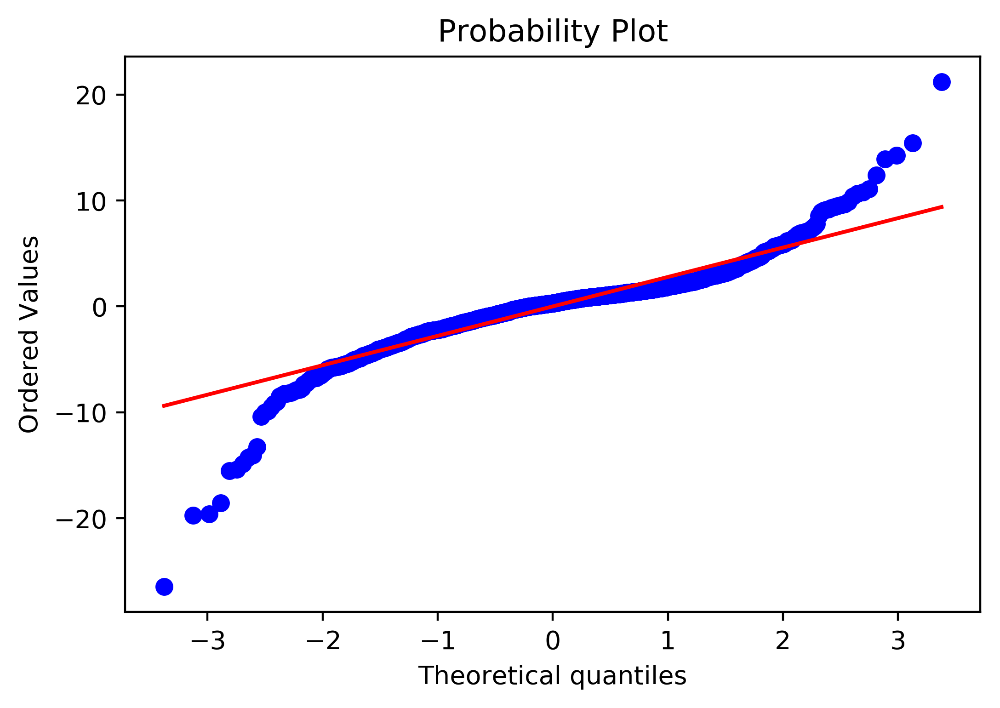

In [318]:
stats.probplot(resid_7,dist='norm',plot=plt)

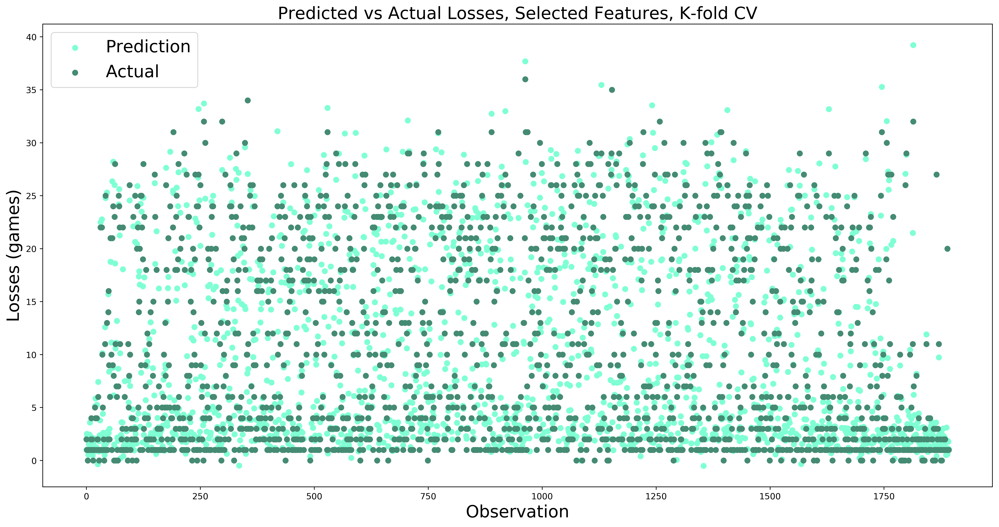

In [319]:
index = [i for i in range(len(predict_7))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_7,label='Prediction',c='#7FFFD4')
plt.scatter(index,y,label='Actual',c='#458B74')
plt.title('Predicted vs Actual Losses, Selected Features, K-fold CV',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Losses (games)',fontsize = 20)
plt.legend(fontsize = 20)

In [286]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(selected_features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

In [328]:
X = df.loc[:,selected_features]
y = df.loc[:,losses]

In [329]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)
Xy_train = X_train.copy()
Xy_train['Losses'] = y_train

In [330]:
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(Xy_train)
df_normalized = pd.DataFrame(np_scaled)
df_normalized.columns = ['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesWon',
 'TotalServicePointsWon','Losses']
df_normalized

,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,DoubleFaults,ReturnGamesWon,ReturnPointsWon,ServiceGamesWon,TotalServicePointsWon,Losses
0,0.403846,0.758065,0.638298,0.546512,0.666667,0.292329,0.41,0.733333,0.538182,0.69,0.493197,0.428571,0.76,0.865979,0.701754,0.611111
1,0.365385,0.758065,0.595745,0.523256,0.640000,0.311679,0.40,0.674074,0.435152,0.61,0.646259,0.357143,0.72,0.824742,0.684211,0.611111
2,0.461538,0.774194,0.617021,0.558140,0.653333,0.210090,0.38,0.494444,0.368485,0.61,0.639456,0.339286,0.72,0.845361,0.719298,0.555556
3,0.480769,0.758065,0.531915,0.534884,0.600000,0.145819,0.36,0.387037,0.202424,0.65,0.350340,0.267857,0.66,0.835052,0.701754,0.583333
4,0.500000,0.629032,0.446809,0.500000,0.560000,0.006911,0.00,0.018519,0.012121,0.45,0.006803,0.000000,0.58,0.752577,0.614035,0.055556
5,0.461538,0.709677,0.680851,0.511628,0.586667,0.024879,0.47,0.088889,0.043636,0.65,0.068027,0.392857,0.72,0.814433,0.649123,0.083333
6,0.442308,0.612903,0.574468,0.465116,0.600000,0.048376,0.36,0.283333,0.122424,0.53,0.224490,0.285714,0.68,0.690722,0.561404,0.444444
7,0.461538,0.774194,0.489362,0.534884,0.586667,0.087077,0.23,0.111111,0.078788,0.70,0.081633,0.196429,0.64,0.886598,0.719298,0.194444
8,0.403846,0.741935,0.531915,0.488372,0.640000,0.215619,0.35,0.512963,0.287273,0.64,0.350340,0.321429,0.68,0.804124,0.649123,0.611111
9,0.461538,0.677419,0.595745,0.418605,0.640000,0.015204,0.41,0.101852,0.038788,0.61,0.054422,0.339286,0.74,0.711340,0.578947,0.138889


In [331]:
#stats model with no patsy
model_2 = smf.ols('Losses ~ FirstServe + FirstServePointsWon + FirstServeReturnPointsWon\
+ SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced\
+ BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesWon\
+ ReturnPointsWon + ServiceGamesWon + TotalServicePointsWon',data=df_normalized)
fit_2 = model_2.fit()
fit_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Losses   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     766.4
Date:                Fri, 27 Apr 2018   Prob (F-statistic):               0.00
Time:                        09:17:47   Log-Likelihood:                 1423.2
No. Observations:                1325   AIC:                            -2814.
Df Residuals:                    1309   BIC:                            -2731.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.0400      0.053      0.751      0.453      -0.064       0.144
FirstServe                    -0.0124      0.043     -0.285      0.775      -0.097       0.073
FirstServePointsWon            0.0565      0.132      0.429      0.668      -0.202       0.315
FirstServeReturnPointsWon      0.0118      0.063      0.186      0.853      -0.112       0.136
SecondServePointsWon           0.0020      0.126      0.016      0.987      -0.245       0.249
SecondServeReturnPointsWon    -0.0153      0.065     -0.234      0.815      -0.144       0.113
Aces                           0.3747      0.034     11.183      0.000       0.309       0.440
BreakPointsConverted          -0.0399      0.019     -2.084      0.037      -0.077      -0.002
BreakPointsFaced               1.5609      0.036     43.535      0.000       1.491       1.631
BreakPointsOpportunities      -0.9973      0.040    -24.961      0.000      -1.076      -0.919
BreakPointsSaved              -0.1410      0.024     -5.786      0.000      -0.189      -0.093
DoubleFaults                  -0.0084      0.031     -0.275      0.783      -0.068       0.052
ReturnGamesWon                -0.0203      0.040     -0.502      0.615      -0.100       0.059
ReturnPointsWon                0.0131      0.114      0.115      0.909      -0.211       0.237
ServiceGamesWon                0.0112      0.053      0.212      0.832      -0.092       0.114
TotalServicePointsWon          0.0779      0.215      0.363      0.717      -0.343       0.499
==============================================================================
Omnibus:                      281.757   Durbin-Watson:                   2.054
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5685.408
Skew:                           0.427   Prob(JB):                         0.00
Kurtosis:                      13.112   Cond. No.                         271.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Regularization

### Ridge Regularization

In [287]:
#split into training and testing data
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

[-0.02400046  3.12075308  2.95206787  0.99077886  0.40836557  0.00560995
  0.06949443  0.01622654  0.00723692  1.09359158  0.02693391  1.00432927
  2.15992939  1.82634019  3.31977347]
[-8.92155230e-01  1.01284232e+00  3.35311043e+00 -1.12324205e+00
 -7.83857950e-01  4.25625046e-03  4.04944641e-01  4.24169330e-02
 -3.95266693e-03 -1.20836220e+00  3.62317952e-02 -4.39717584e+00
 -1.50643298e+00  1.89605577e+00  5.17704874e-01]
[-1.40015198  1.95252381  4.85505697 -1.06505035  0.51550493  0.00724952
 -0.53571451  0.08492334 -0.03224943 -3.45213194  0.01481685 -2.41325381
 -4.61427349  1.02986239  4.30182451]
[-2.21563060e+00  9.52177724e-01  5.03921653e+00 -2.03230808e+00
  9.38593450e-01  8.99188359e-03 -1.08612287e+00  9.97552725e-02
 -4.20874743e-02 -4.11068531e+00  4.12515436e-03 -5.05190363e-01
 -5.95871305e+00  2.76449346e-01  9.04600818e+00]


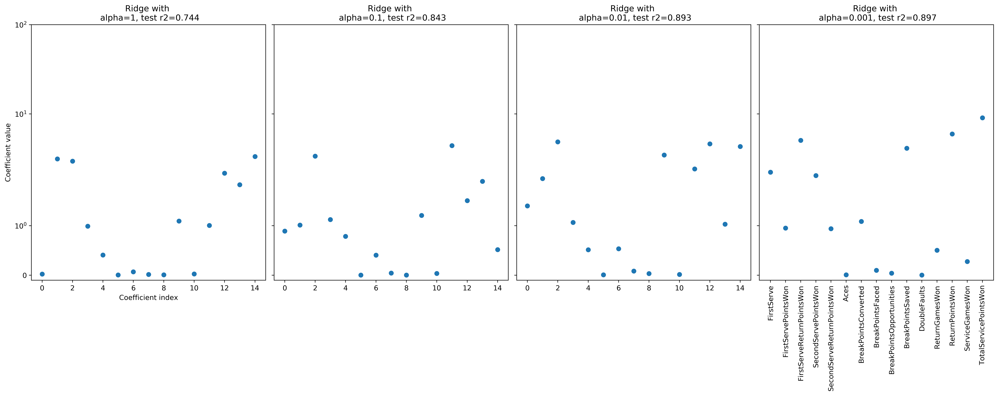

In [288]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.Ridge(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Ridge with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e2))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [289]:
est = linear_model.Ridge(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(2.215630599578429, 'FirstServe'),
 (0.9521777241618912, 'FirstServePointsWon'),
 (5.039216529897623, 'FirstServeReturnPointsWon'),
 (2.032308081755104, 'SecondServePointsWon'),
 (0.9385934502312228, 'SecondServeReturnPointsWon'),
 (0.008991883586660742, 'Aces'),
 (1.0861228679299746, 'BreakPointsConverted'),
 (0.09975527252343702, 'BreakPointsFaced'),
 (0.04208747429249285, 'BreakPointsOpportunities'),
 (4.110685309506725, 'BreakPointsSaved'),
 (0.00412515436123585, 'DoubleFaults'),
 (0.5051903626245874, 'ReturnGamesWon'),
 (5.958713047492283, 'ReturnPointsWon'),
 (0.2764493462262138, 'ServiceGamesWon'),
 (9.046008175491398, 'TotalServicePointsWon')]

### Lasso Regularization

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0.         0.         0.         0.         0.         0.
 0.         0.03455289 0.         0.         0.         0.
 0.         0.         0.        ]
[-0.00000000e+00  0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00  1.74151317e-03 -0.00000000e+00  5.13910075e-02
 -0.00000000e+00 -0.00000000e+00  1.49039262e-02 -2.28657019e+00
 -0.00000000e+00  0.00000000e+00  0.00000000e+00]
[-3.09056696e-01  4.74703441e+00  0.00000000e+00  0.00000000e+00
 -9.50367432e-01  8.38103612e-03 -7.82576013e-01  9.58668515e-02
 -3.82581494e-02 -3.29401967e+00  4.11942420e-03 -4.22386469e-01
 -0.00000000e+00  2.50451717e-01  1.66195793e+00]


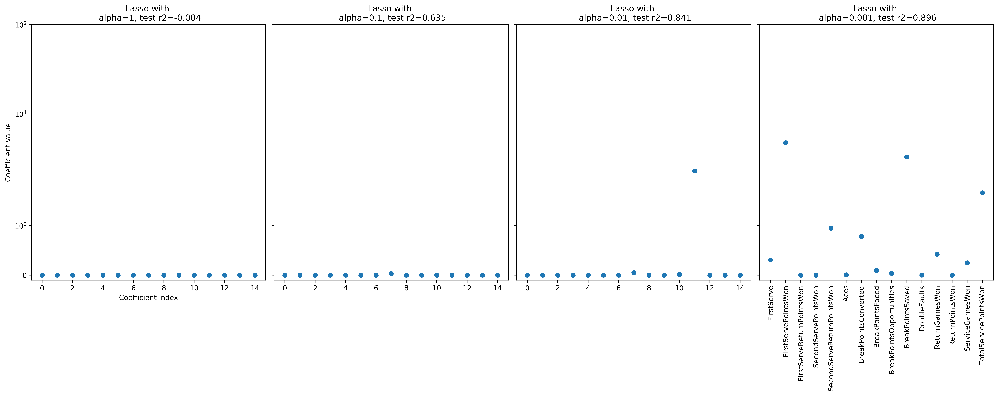

In [290]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.Lasso(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Lasso with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e2))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [291]:
est = linear_model.Lasso(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(0.30905669560024024, 'FirstServe'),
 (4.747034409527635, 'FirstServePointsWon'),
 (0.0, 'FirstServeReturnPointsWon'),
 (0.0, 'SecondServePointsWon'),
 (0.9503674315359213, 'SecondServeReturnPointsWon'),
 (0.008381036116757726, 'Aces'),
 (0.7825760133237605, 'BreakPointsConverted'),
 (0.0958668515448691, 'BreakPointsFaced'),
 (0.03825814941793199, 'BreakPointsOpportunities'),
 (3.294019673392104, 'BreakPointsSaved'),
 (0.004119424195783029, 'DoubleFaults'),
 (0.422386469324465, 'ReturnGamesWon'),
 (0.0, 'ReturnPointsWon'),
 (0.25045171684119005, 'ServiceGamesWon'),
 (1.6619579346020374, 'TotalServicePointsWon')]

### Elastic Net Regularization

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0.00000000e+00 2.98626400e-01 1.41905828e-01 1.47426953e-01
 0.00000000e+00 3.51870049e-04 0.00000000e+00 6.89331320e-04
 4.65584796e-04 7.82425724e-02 1.31970523e-03 1.35757663e-01
 2.05998451e-01 2.03637534e-01 4.45542302e-01]
[3.04611575e-01 3.01830429e+00 2.60731476e+00 2.06408563e+00
 1.32825827e+00 2.91888720e-03 1.98607588e-01 5.78233670e-03
 3.73785899e-03 1.25237105e+00 1.09360230e-02 1.88557464e+00
 3.00523629e+00 1.81469979e+00 3.88615216e+00]
[-0.05950335  2.51956819  2.58703204  0.29566812  0.          0.00561972
  0.00834734  0.01933476  0.00709243  0.69707977  0.03014574  0.09231035
  1.20596456  1.6363377   2.47132005]


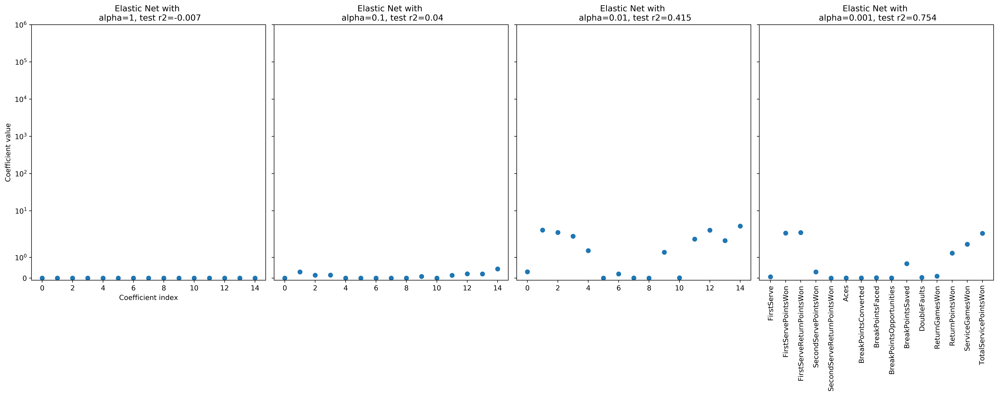

In [292]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.ElasticNet(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Elastic Net with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e6))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [293]:
est = linear_model.ElasticNet(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(0.05950335033440485, 'FirstServe'),
 (2.5195681883445986, 'FirstServePointsWon'),
 (2.587032042041131, 'FirstServeReturnPointsWon'),
 (0.29566812330336706, 'SecondServePointsWon'),
 (0.0, 'SecondServeReturnPointsWon'),
 (0.005619722504244343, 'Aces'),
 (0.008347337292130726, 'BreakPointsConverted'),
 (0.01933476423728037, 'BreakPointsFaced'),
 (0.007092431822258593, 'BreakPointsOpportunities'),
 (0.6970797707426335, 'BreakPointsSaved'),
 (0.03014574289730856, 'DoubleFaults'),
 (0.09231035312441145, 'ReturnGamesWon'),
 (1.20596456114187, 'ReturnPointsWon'),
 (1.6363376999325168, 'ServiceGamesWon'),
 (2.4713200531458064, 'TotalServicePointsWon')]

### Pipeline, Selek K best with selected features

In [294]:
X = df.loc[:,selected_features]
y = df.loc[:,losses]

In [295]:
select_pipe = pipeline.Pipeline(
    #preprocess data
    [("imp", preprocessing.Imputer()), 
     #scale features
     ("std", preprocessing.StandardScaler()),
     #select k best
     ("select",
      feature_selection.SelectKBest(
          score_func=feature_selection.f_regression)), 
     #use linear regression
     ("lin", LinearRegression())
    ])

In [296]:
select_pipe.fit(X,y)
select_pipe.score(X,y)

0.8964736629900241

In [297]:
feat_support = select_pipe.named_steps["select"].get_support()
feat = X.columns[feat_support]
coef = select_pipe.named_steps["lin"].coef_

list(zip(feat, coef))

[('FirstServePointsWon', 0.17640661337548913),
 ('SecondServePointsWon', -0.023904791867524068),
 ('Aces', 1.6028702142540872),
 ('BreakPointsFaced', 13.621850550843366),
 ('BreakPointsOpportunities', -6.9287873838920095),
 ('DoubleFaults', 0.22851441926220392),
 ('ReturnGamesWon', -0.33818390645927443),
 ('ReturnPointsWon', 0.17336872300577735),
 ('ServiceGamesWon', -0.19016037464415844),
 ('TotalServicePointsWon', 0.3402834376426182)]

In [298]:
cv_result = model_selection.cross_validate(
        select_pipe, X=X, y=y, cv=10, return_train_score=True)
print(f"train: {np.mean(cv_result['train_score']):.3}, test: {np.mean(cv_result['test_score']):.3}")

train: 0.898, test: 0.887


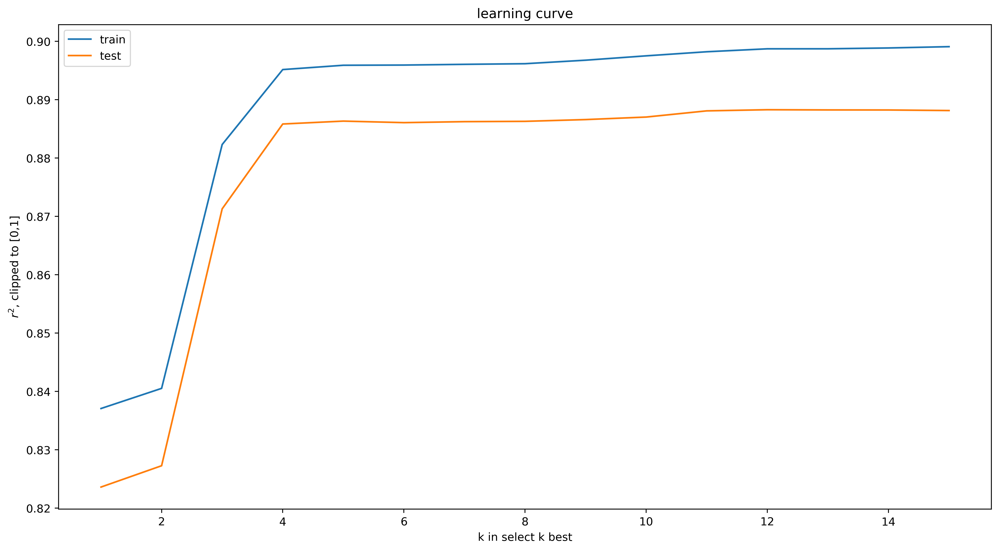

In [299]:
plt.figure(figsize=(15, 8))


train_scores = []
test_scores = []
# define feature range
num_feats = len(X.columns)
feat_range = np.arange(num_feats)+1
# for each k in feat_range
for num_f in feat_range:
    # set pipeline params
    select_pipe.set_params(select__k=num_f)
    # get cross val scores
    cv_result = model_selection.cross_validate(
        select_pipe, X=X, y=y, cv=10, return_train_score=True)
    train_scores.append(np.maximum(np.mean(cv_result['train_score']), 0))
    test_scores.append(np.maximum(np.mean(cv_result['test_score']), 0))

# plot test vs train
plt.plot(feat_range, train_scores, label="train")
plt.plot(feat_range, test_scores, label="test")

# find index of best score
best_i = np.argmax(test_scores)
# annotate score
# ann_xy = (feat_range[best_i], test_scores[best_i])
# ann_text = f"$r^2$={test_scores[best_i]:.2}, $k$={feat_range[best_i]}"
# annotate(ann_text, xy=ann_xy, xytext=(.6,.4), textcoords='axes fraction',
#             arrowprops=dict(arrowstyle="->"),
#             )

plt.xlabel("k in select k best")
plt.ylabel("$r^2$, clipped to [0,1]")
plt.title("learning curve")
plt.legend()

In [300]:
best_i

11

In [301]:
test_scores

[0.8236013866175874,
 0.8272564815792387,
 0.8712961860093372,
 0.8858390094745161,
 0.8863357206599194,
 0.8860729532133332,
 0.8862430425137395,
 0.8862945108414518,
 0.8865973792273346,
 0.887029846061607,
 0.8880918142708485,
 0.888286657286564,
 0.8882514314865816,
 0.8882412383617897,
 0.8881468583794095]